# Data exploration 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# loading of data
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")
print(train.head())

     id                       SMILES      Tm  Group 1  Group 2  Group 3  \
0  2175        FC1=C(F)C(F)(F)C1(F)F  213.15        0        0        0   
1  1222  c1ccc2c(c1)ccc3Nc4ccccc4c23  407.15        0        0        0   
2  2994          CCN1C(C)=Nc2ccccc12  324.15        2        1        0   
3  1704                   CC#CC(=O)O  351.15        1        0        0   
4  2526                    CCCCC(S)C  126.15        2        3        0   

   Group 4  Group 5  Group 6  Group 7  ...  Group 415  Group 416  Group 417  \
0        0        0        0        0  ...          0          0          0   
1        0        0        0        0  ...          0          0          0   
2        0        0        0        0  ...          0          0          0   
3        0        0        0        0  ...          0          0          0   
4        0        0        0        0  ...          0          0          0   

   Group 418  Group 419  Group 420  Group 421  Group 422  Group 423  Group

In [2]:
# value counts
for column in train.columns:
    print("Column:", column)
    print(train[column].value_counts())

Column: id
id
2175    1
1222    1
2994    1
1704    1
2526    1
       ..
707     1
1573    1
1634    1
3022    1
1673    1
Name: count, Length: 2662, dtype: int64
Column: SMILES
SMILES
FC1=C(F)C(F)(F)C1(F)F          1
c1ccc2c(c1)ccc3Nc4ccccc4c23    1
CCN1C(C)=Nc2ccccc12            1
CC#CC(=O)O                     1
CCCCC(S)C                      1
                              ..
ClCCBr                         1
N#CC(Cl)(Cl)Cl                 1
Cc1ccc2c(C)cccc2c1             1
CCC(=O)c1ccc2ccccc2c1          1
Brc1ccc(cc1)N(C)C              1
Name: count, Length: 2662, dtype: int64
Column: Tm
Tm
193.15    21
203.15    19
253.15    16
302.15    16
213.15    15
          ..
104.65     1
151.15     1
150.65     1
132.25     1
555.15     1
Name: count, Length: 1195, dtype: int64
Column: Group 1
Group 1
0     1251
1      656
2      463
3      160
4       83
6       21
5       15
8        4
9        3
7        3
14       1
12       1
16       1
Name: count, dtype: int64
Column: Group 2
Group

In [3]:
# number of columns containing only 0 in train set
zero_only_cols = (train == 0).all(axis = 0)
num_zero_only_cols = zero_only_cols.sum()

print("Number of columns containing only 0 in train set:", num_zero_only_cols)

Number of columns containing only 0 in train set: 87


In [14]:
# number of columns containing only 0 or 1 in train set
zero_one_only_cols = ((train == 0) | (train == 1)).all(axis = 0)
num_zero_one_only_cols = zero_one_only_cols.sum()

print("Number of columns containing only 0 or 1 in train set:", num_zero_one_only_cols)

Number of columns containing only 0 or 1 in train set: 259


In [4]:
# number of columns containing only 0 in test set
zero_only_cols = (test == 0).all(axis = 0)
num_zero_only_cols = zero_only_cols.sum()

print("Number of columns containing only 0 in test set:", num_zero_only_cols)

Number of columns containing only 0 in test set: 179


/var/folders/gp/gb7m6_b16jv_syq297v4tzj40000gn/T/ipykernel_965/2277559685.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


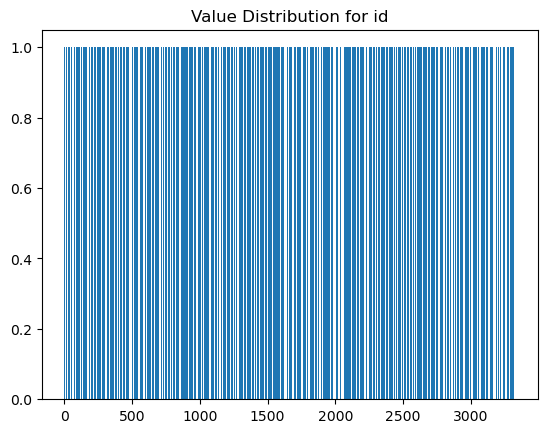

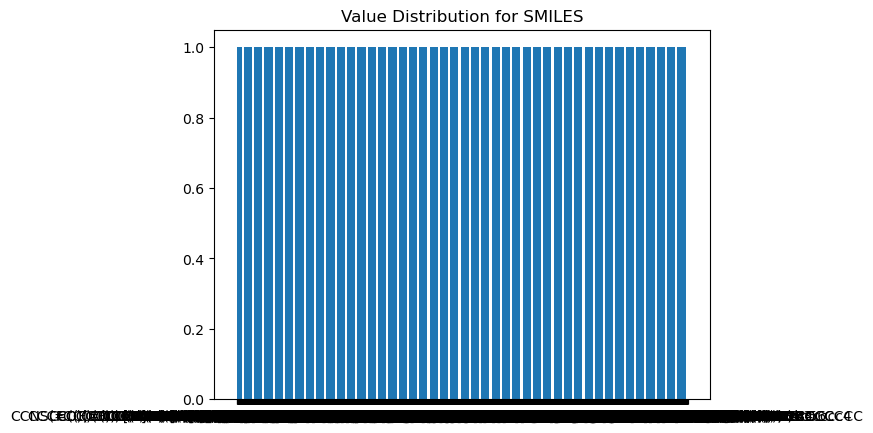

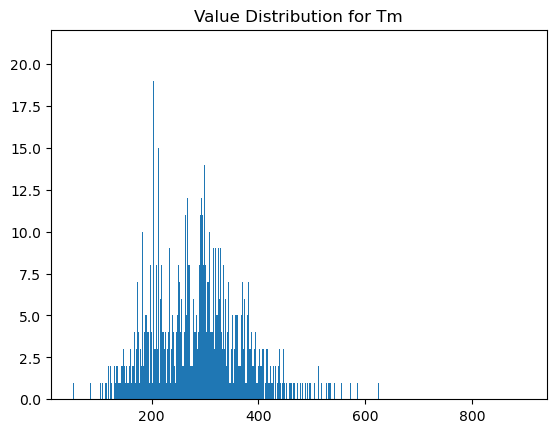

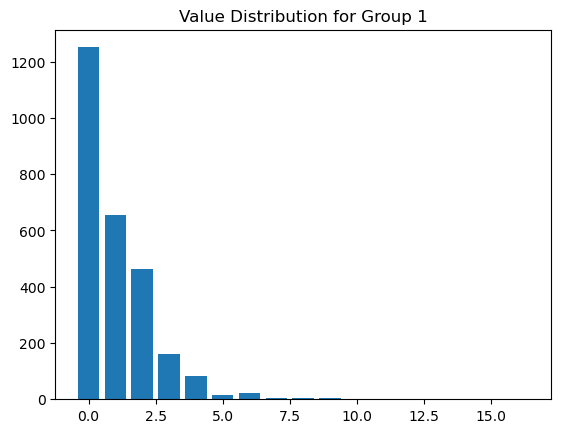

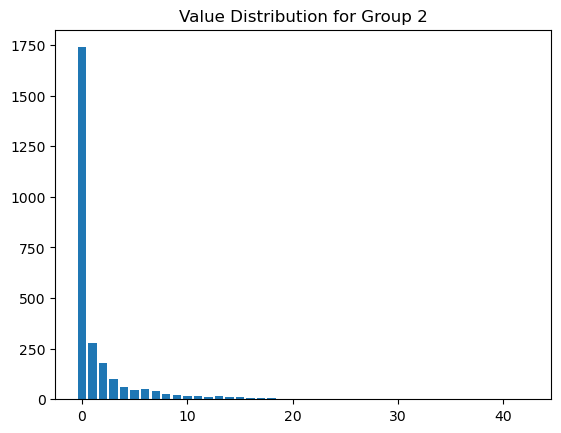

...

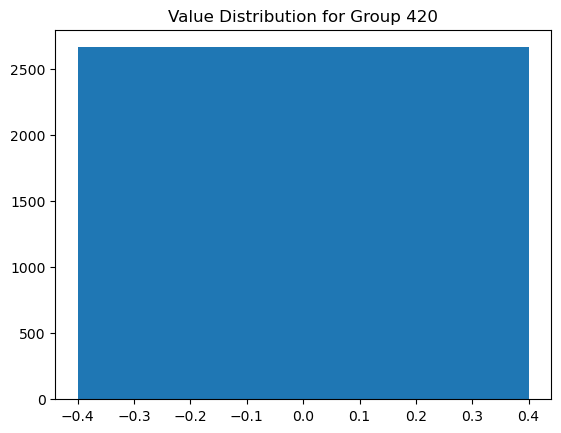

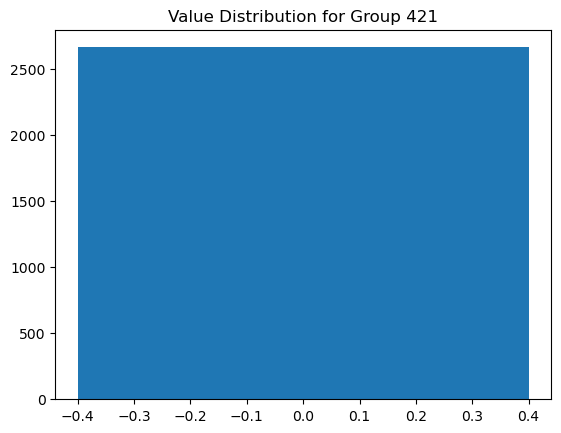

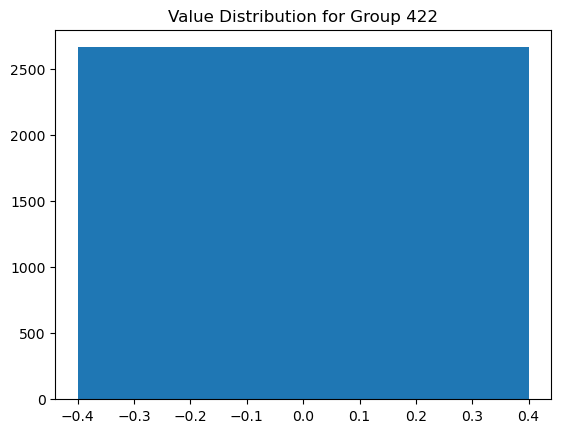

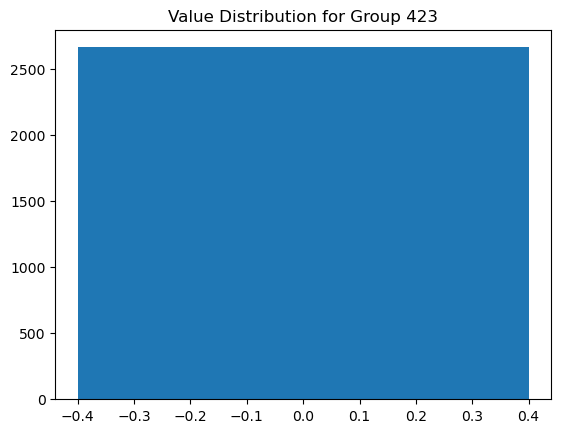

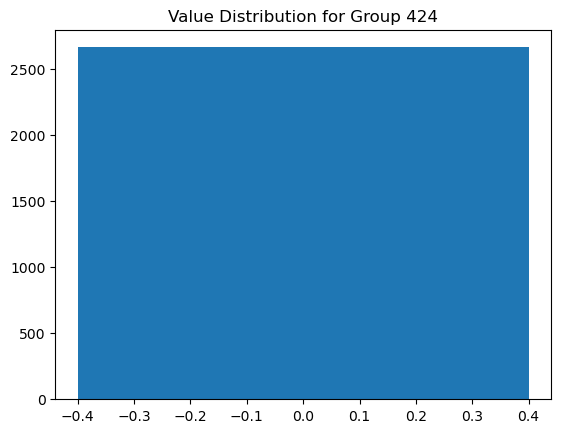

In [6]:
for column in train.columns:
    counts = train[column].value_counts()

    plt.figure()
    plt.bar(x = counts.index, height = counts.values)
    plt.title(f"Value Distribution for {column}")
plt.show()

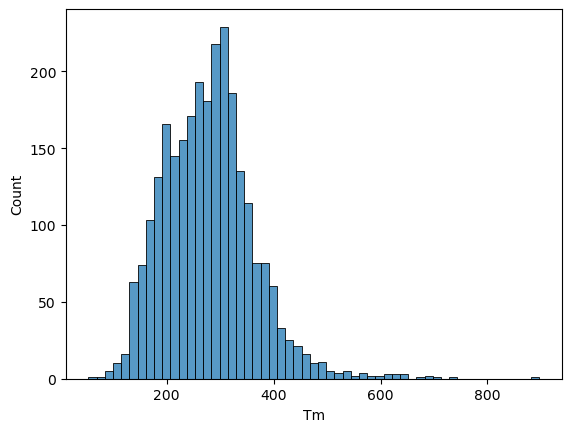

In [2]:
sns.histplot(train['Tm'])
plt.show()

/var/folders/gp/gb7m6_b16jv_syq297v4tzj40000gn/T/ipykernel_965/4076742203.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


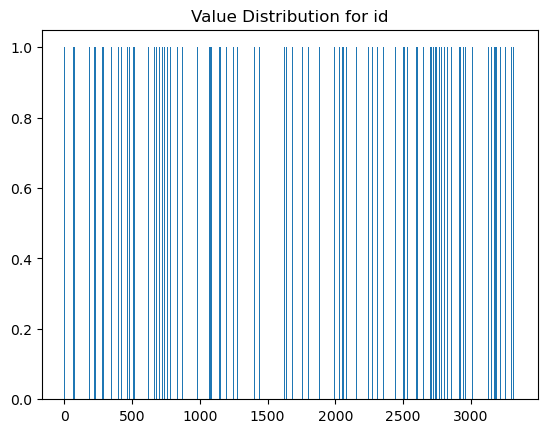

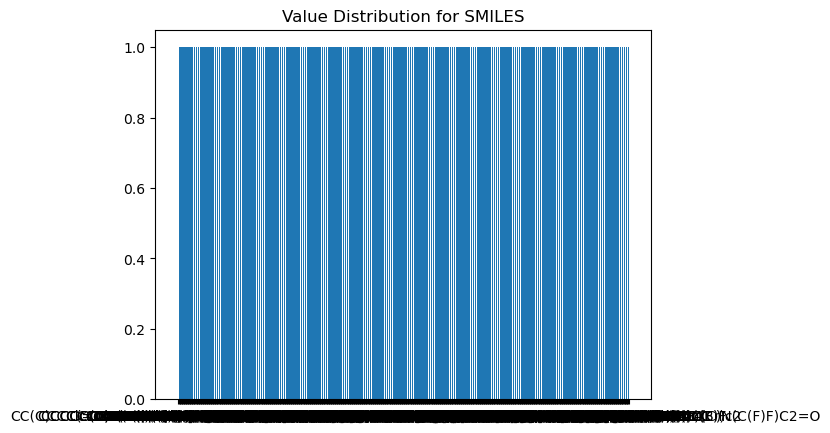

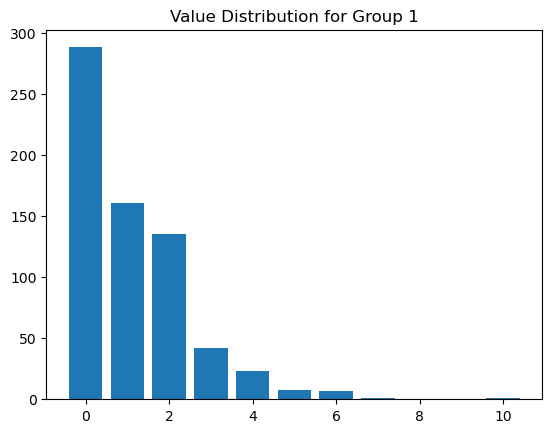

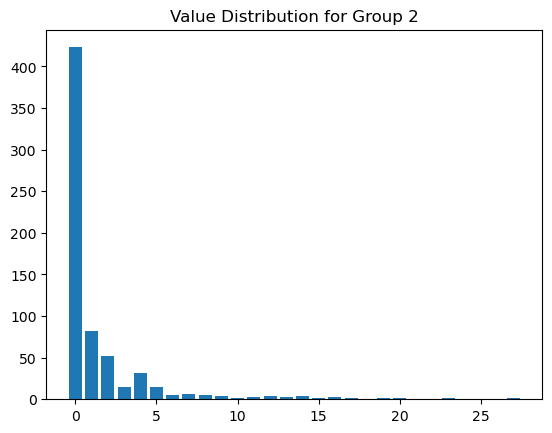

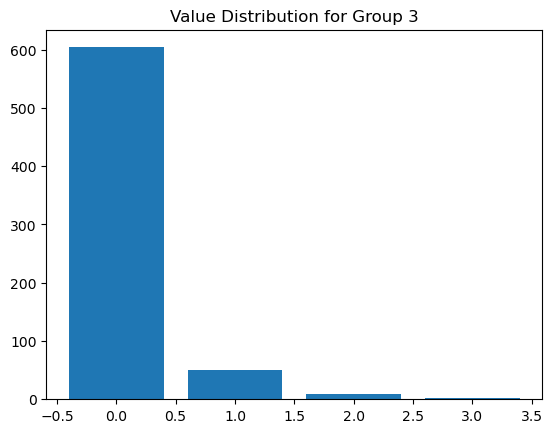

...

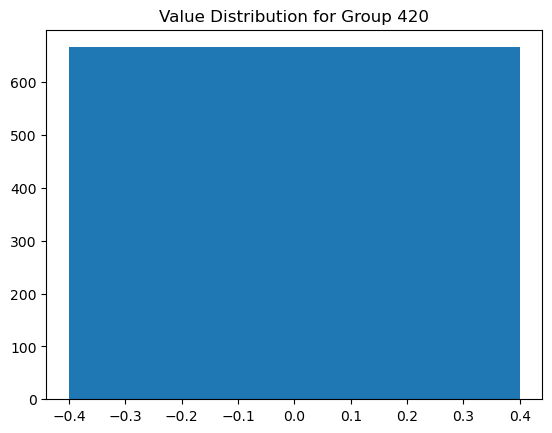

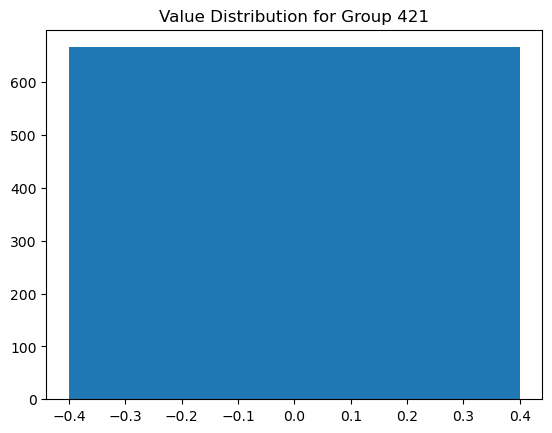

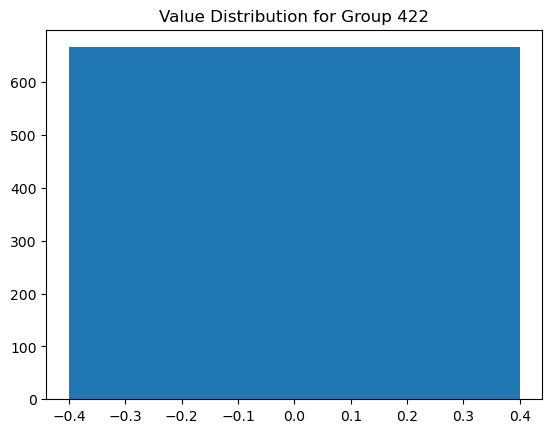

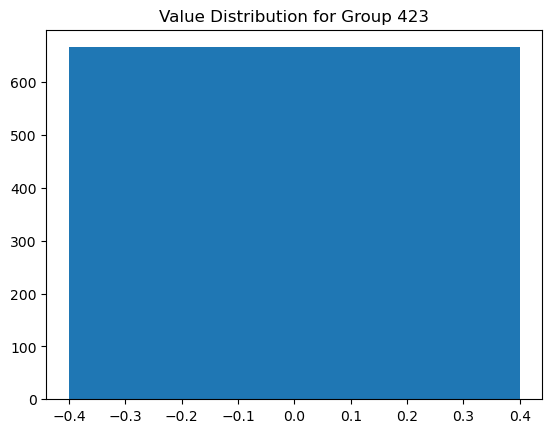

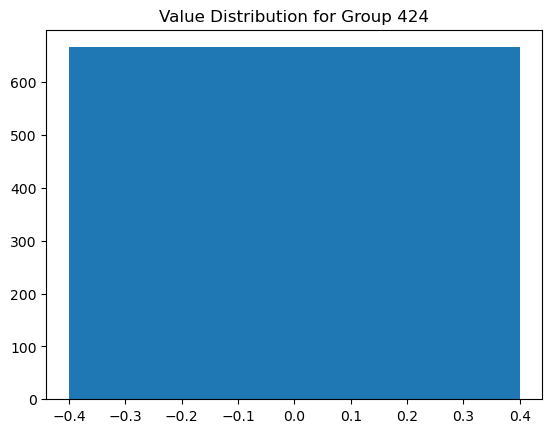

In [7]:
for column in test.columns:
    counts = test[column].value_counts()

    plt.figure()
    plt.bar(x = counts.index, height = counts.values)
    plt.title(f"Value Distribution for {column}")
plt.show()

In [10]:
tm_series = train["Tm"]
print("Minimum melting point =", min(tm_series))
print("Maximum melting point =", max(tm_series))

Minimum melting point = 53.54
Maximum melting point = 897.15


In [16]:
# check for NaNs
nan_train = train.isnull().sum()
print("Number of NaNs in train set:", nan_train)
nan_test = test.isnull().sum()
print("Number of NaNs in test set:", nan_test)

Number of NaNs in train set: id           0
SMILES       0
Tm           0
Group 1      0
Group 2      0
            ..
Group 420    0
Group 421    0
Group 422    0
Group 423    0
Group 424    0
Length: 427, dtype: int64
Number of NaNs in test set: id           0
SMILES       0
Group 1      0
Group 2      0
Group 3      0
            ..
Group 420    0
Group 421    0
Group 422    0
Group 423    0
Group 424    0
Length: 426, dtype: int64


In [17]:
# summary statistics
print(train.describe())

                id           Tm      Group 1      Group 2      Group 3  \
count  2662.000000  2662.000000  2662.000000  2662.000000  2662.000000   
mean   1652.887303   278.263452     1.020661     1.582269     0.114951   
std     955.005512    85.117914     1.353640     3.738416     0.425964   
min       1.000000    53.540000     0.000000     0.000000     0.000000   
25%     830.250000   217.000000     0.000000     0.000000     0.000000   
50%    1642.500000   277.300000     1.000000     0.000000     0.000000   
75%    2469.750000   325.150000     2.000000     1.000000     0.000000   
max    3328.000000   897.150000    16.000000    42.000000     6.000000   

           Group 4      Group 5      Group 6      Group 7      Group 8  ...  \
count  2662.000000  2662.000000  2662.000000  2662.000000  2662.000000  ...   
mean      0.036439     0.036814     0.022915     0.013524     0.010143  ...   
std       0.208307     0.205516     0.164037     0.118732     0.117480  ...   
min       0.00000

In [19]:
# check if there are instances (molecules) that have 0 in all features (as a quality/logic check)
X_train = train.drop(["id", "SMILES", "Tm"], axis = 1)
X_test = test.drop(["id", "SMILES"], axis = 1)

rows_all_zero_train = (X_train == 0).all(axis = 1)
rows_all_zero_test = (X_test == 0).all(axis = 1)

num_rows_all_zero_train = rows_all_zero_train.sum()
num_rows_all_zero_test = rows_all_zero_test.sum()

print(num_rows_all_zero_train)
print(num_rows_all_zero_test)

# --> result: no rows contain only zeros

0
0


### PCA

- feature space is high-dimensional --> PCA can help reveal low-dimensional structure (does most variance lie in a small number of combinations of functional groups?)
- some features might be correlated
- shows whether the molecules cluster naturally
- problems: PCA relies on linear combinations; it may not capture nonlinear chemical relationships; data should be scaled

Original dimension: (2662, 424)
Reduced dimension: (2662, 274)
Explained variance ratio: [0.01286727 0.01214623 0.00970088 0.00863016 0.00797825 0.00783154
 0.00739102 0.0071226  0.00696753 0.00676761 0.00647715 0.00635427
 0.00624623 0.00616489 0.00609114 0.00603    0.00596318 0.0059119
 0.00588488 0.0057823  0.0057164  0.00561167 0.00551063 0.00544849
 0.00534716 0.00527115 0.00521176 0.0051877  0.00513741 0.0051049
 0.00508857 0.00505777 0.00504975 0.00501525 0.00499293 0.00494638
 0.00486438 0.00482838 0.00479315 0.0047455  0.0046923  0.00464168
 0.00461518 0.00454783 0.00450391 0.00448278 0.00442066 0.00439441
 0.00436856 0.00432648 0.00424382 0.00423354 0.00418753 0.00416648
 0.00414858 0.00410324 0.00406695 0.00404697 0.00403075 0.00401649
 0.00396176 0.00394536 0.00392681 0.00386978 0.0038441  0.00383637
 0.00381093 0.00378181 0.00375245 0.00373635 0.00371398 0.00369331
 0.00365741 0.00364896 0.00362299 0.00359651 0.00359135 0.0035686
 0.00354047 0.00352266 0.00351248 0.0034838

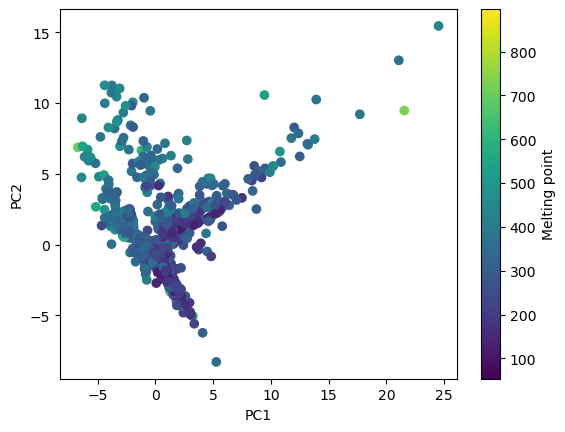

In [1]:
# import of required libraries
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# loading of data & separating features and target
df = pd.read_csv("train.csv")
X = df.drop(["id", "SMILES", "Tm"], axis = 1)
y = df["Tm"]

# standardization of features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# PCA
pca = PCA(n_components = 0.95) # keep enough components to explain 95% variance
X_pca = pca.fit_transform(X_scaled)

print("Original dimension:", X.shape)
print("Reduced dimension:", X_pca.shape)
print("Explained variance ratio:", pca.explained_variance_ratio_)
print("Total retained variance:", pca.explained_variance_ratio_.sum())

# 2D PCA for visualization
pca2 = PCA(n_components = 2)
X_pca2 = pca2.fit_transform(X_scaled)

plt.figure() #figsize = (8,6)
scatter = plt.scatter(X_pca2[:,0], X_pca2[:,1], c = y)
plt.colorbar(scatter, label = "Melting point")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

Interpretation:

274 of 424 features needed to explain 95 % of the variance --> shows that:
- functional-group features are not very redundant
- most variance is spread across many features
- there is no simple low-dimensional structure

PCA2 (2 principal components):
- no clear clustering based on functional groups
- no clear gradients of melting points along PC1 and PC2 --> no simple linear relationship between Tm and the PCs
- first PCs in count-based data usually mainly separate by size of the molecule / total number of functional groups